# Generative Adversarial Networks Mini Project

In [1]:
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt
from torchvision.utils import save_image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Data Set

In [2]:
import cs236781.plot as plot
import cs236781.download

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')

DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /home/sakasova/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/sakasova/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/sakasova/.pytorch-datasets/lfw/George_W_Bush


In [3]:
# Data set object

import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)


Found 530 images in dataset folder.


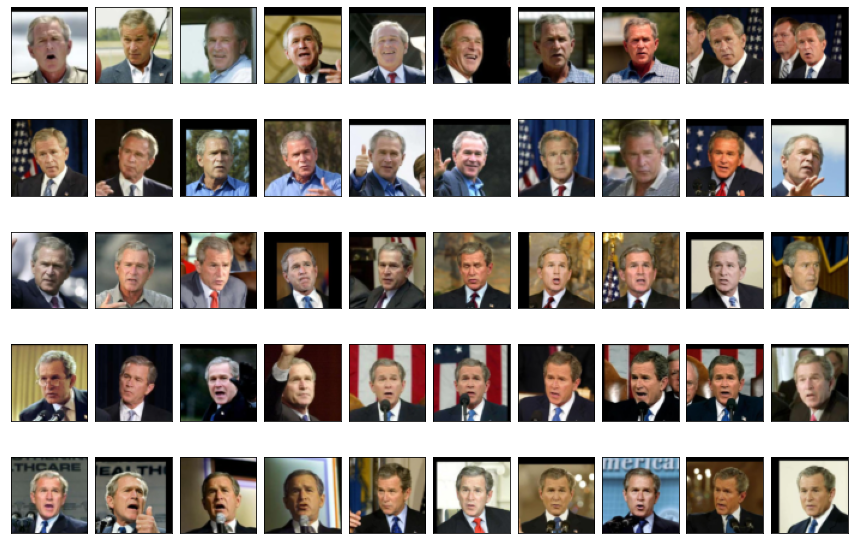

In [4]:
# Plot data set object

_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')


In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

torch.Size([1, 3, 64, 64])


### Vanilla GAN 

In [6]:
import gan_ver2
from gan_ver2 import discriminator_loss_fn
from gan_ver2 import generator_loss_fn
# Vanilla Discriminator
dsc = gan_ver2.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)
# Generator
z_dim = 128
gen = gan_ver2.Generator(z_dim, 4).to(device)
print(gen)

torch.manual_seed(42)

#Discriminator loss function
y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10
D_loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(D_loss)

#Generator loss function
y_generated = torch.rand(20) * 10
G_loss = generator_loss_fn(y_generated, data_label=1)
print(G_loss)

Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (2): ReLU()
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (6): ReLU()
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): MaxPool2d(kernel_size=8, stride=8, padding=0, dilation=1, ceil_mode=False)
    (10): ReLU()
    (11): Conv2d(256, 512, kernel_size=(1, 1), stride=(1, 1))
    (12): ReLU()
    (13): Conv2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
    (14): Sigmoid()
  )
)
Generator(
  (cnn): Sequential(
    (0): ConvTranspose2d(128, 256, kernel_size=(4, 4), stri

#### Training

In [7]:
import torch.optim as optim
from torch.utils.data import DataLoader

torch.manual_seed(42)
# GAN Hyperparameters
hypers = dict(batch_size=0,
        z_dim=0,
        data_label=0,
        label_noise=0.0,
        discriminator_optimizer=dict(
            type="",  # Any name in nn.optim like SGD, Adam
            lr=0.0,
            # You an add extra args for the optimizer here
        ),
        generator_optimizer=dict(
            type="",  # Any name in nn.optim like SGD, Adam
            lr=0.0,
            # You an add extra args for the optimizer here
        ),
    )
lr = 0.0002
hypers['batch_size'] = 4
hypers['z_dim'] = 512
hypers['data_label'] = 1
hypers['label_noise'] = 0.2
hypers['discriminator_optimizer']['type'] = 'Adam'
hypers['discriminator_optimizer']['lr'] = lr
hypers['generator_optimizer']['type'] = 'Adam'
hypers['generator_optimizer']['lr'] = lr


batch_size = hypers['batch_size']
z_dim = hypers['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan_ver2.Discriminator(im_size).to(device)
gen = gan_ver2.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)

dsc_optimizer = create_optimizer(dsc.parameters(), hypers['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hypers['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan_ver2.discriminator_loss_fn(y_data, y_generated, hypers['data_label'], hypers['label_noise'])

def gen_loss_fn(y_generated):
    return gan_ver2.generator_loss_fn(y_generated, hypers['data_label'])

# Training
checkpoint_file = 'checkpoints/vgan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hypers)

{'batch_size': 4, 'z_dim': 512, 'data_label': 1, 'label_noise': 0.2, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002}}


**Training Loop**

--- EPOCH 1/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.72it/s]
Discriminator loss: 0.1853604062593409
Generator loss:     0.8237033775426391


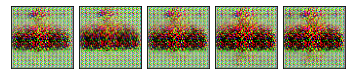

--- EPOCH 2/100 ---
100%|██████████| 133/133 [00:07<00:00, 17.70it/s]
Discriminator loss: 0.5140581216069666
Generator loss:     0.8522574773296377
Saved checkpoint.


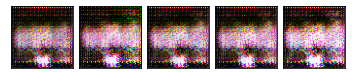

--- EPOCH 3/100 ---
100%|██████████| 133/133 [00:06<00:00, 19.35it/s]
Discriminator loss: 0.451205248617098
Generator loss:     0.5894583599375827
Saved checkpoint.


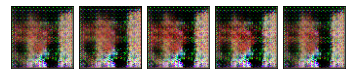

--- EPOCH 4/100 ---
100%|██████████| 133/133 [00:06<00:00, 21.62it/s]
Discriminator loss: 0.42933521588522017
Generator loss:     0.6171009644753951
Saved checkpoint.


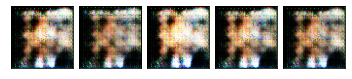

--- EPOCH 5/100 ---
100%|██████████| 133/133 [00:07<00:00, 18.72it/s]
Discriminator loss: 0.5491976965694947
Generator loss:     0.6904264591578254
Saved checkpoint.


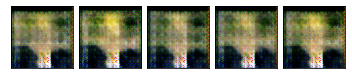

--- EPOCH 6/100 ---
100%|██████████| 133/133 [00:07<00:00, 18.30it/s]
Discriminator loss: 0.512901796281856
Generator loss:     0.563033180374344
Saved checkpoint.


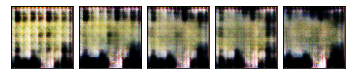

--- EPOCH 7/100 ---
100%|██████████| 133/133 [00:05<00:00, 23.81it/s]
Discriminator loss: 0.35946212114444126
Generator loss:     0.625115563224693


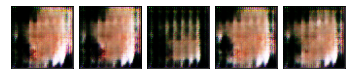

--- EPOCH 8/100 ---
100%|██████████| 133/133 [00:04<00:00, 26.69it/s]
Discriminator loss: 0.27582752305482117
Generator loss:     0.5393938535292234


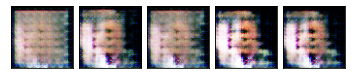

--- EPOCH 9/100 ---
100%|██████████| 133/133 [00:09<00:00, 13.91it/s]
Discriminator loss: 0.7923822245119434
Generator loss:     0.8188834984723786
Saved checkpoint.


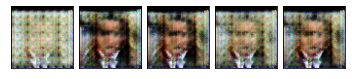

--- EPOCH 10/100 ---
100%|██████████| 133/133 [00:06<00:00, 21.53it/s]
Discriminator loss: 0.36840893478741993
Generator loss:     0.5993327177724892


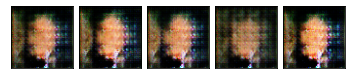

--- EPOCH 11/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.77it/s]
Discriminator loss: 0.9964213232348736
Generator loss:     0.9886978456848546
Saved checkpoint.


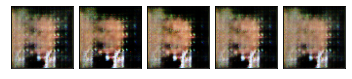

--- EPOCH 12/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.99it/s]
Discriminator loss: 0.9842312936496017
Generator loss:     0.9553758963606411
Saved checkpoint.


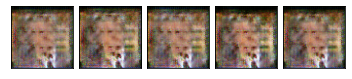

--- EPOCH 13/100 ---
100%|██████████| 133/133 [00:09<00:00, 14.54it/s]
Discriminator loss: 0.6630332751157588
Generator loss:     0.7506830544400036
Saved checkpoint.


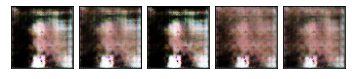

--- EPOCH 14/100 ---
100%|██████████| 133/133 [00:11<00:00, 11.81it/s]
Discriminator loss: 0.7639356171064555
Generator loss:     0.8780665834595386
Saved checkpoint.


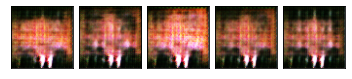

--- EPOCH 15/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.15it/s]
Discriminator loss: 0.9998744663439298
Generator loss:     0.9988426593013275
Saved checkpoint.


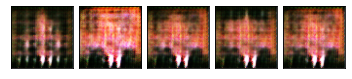

--- EPOCH 16/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.31it/s]
Discriminator loss: 0.9999480906285738
Generator loss:     0.9993787815696314
Saved checkpoint.


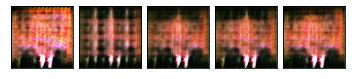

--- EPOCH 17/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.93it/s]
Discriminator loss: 0.99997016316966
Generator loss:     0.9995559911082562
Saved checkpoint.


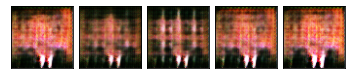

--- EPOCH 18/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.73it/s]
Discriminator loss: 0.9999808350900062
Generator loss:     0.9996790410880756
Saved checkpoint.


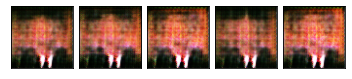

--- EPOCH 19/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.28it/s]
Discriminator loss: 0.9999877115837613
Generator loss:     0.9997541106733164
Saved checkpoint.


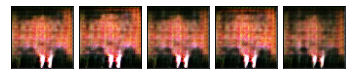

--- EPOCH 20/100 ---
100%|██████████| 133/133 [00:12<00:00, 11.00it/s]
Discriminator loss: 0.9999917189877733
Generator loss:     0.9998114530305217
Saved checkpoint.


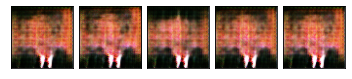

--- EPOCH 21/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.64it/s]
Discriminator loss: 0.9999944872425911
Generator loss:     0.9998461151481571
Saved checkpoint.


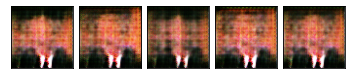

--- EPOCH 22/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.51it/s]
Discriminator loss: 0.9999962565594149
Generator loss:     0.9998666760616732
Saved checkpoint.


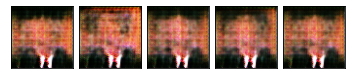

--- EPOCH 23/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.89it/s]
Discriminator loss: 0.9999975790654806
Generator loss:     0.9998839381045865
Saved checkpoint.


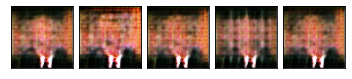

--- EPOCH 24/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.80it/s]
Discriminator loss: 0.9999981939344478
Generator loss:     0.9999123677275235
Saved checkpoint.


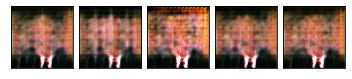

--- EPOCH 25/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.82it/s]
Discriminator loss: 0.9999988576523343
Generator loss:     0.9999210529757622
Saved checkpoint.


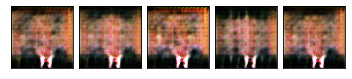

--- EPOCH 26/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.81it/s]
Discriminator loss: 0.9999992004910806
Generator loss:     0.9999318306607411
Saved checkpoint.


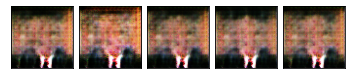

--- EPOCH 27/100 ---
100%|██████████| 133/133 [00:12<00:00, 11.02it/s]
Discriminator loss: 0.999999447424609
Generator loss:     0.999939883561959
Saved checkpoint.


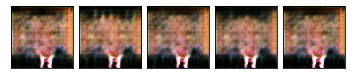

--- EPOCH 28/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.93it/s]
Discriminator loss: 0.9999996235496119
Generator loss:     0.9999436489621499
Saved checkpoint.


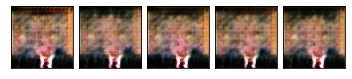

--- EPOCH 29/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.62it/s]
Discriminator loss: 0.999999741862591
Generator loss:     0.9999470016113797
Saved checkpoint.


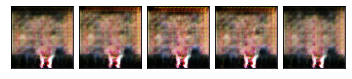

--- EPOCH 30/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.87it/s]
Discriminator loss: 0.9999998382159642
Generator loss:     0.9999584945520961
Saved checkpoint.


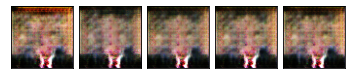

--- EPOCH 31/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.88it/s]
Discriminator loss: 0.9999998942353672
Generator loss:     0.9999650779523348
Saved checkpoint.


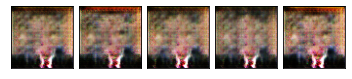

--- EPOCH 32/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.92it/s]
Discriminator loss: 1.0
Generator loss:     0.9999969547852537
Saved checkpoint.


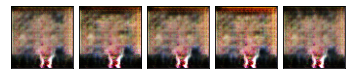

--- EPOCH 33/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.88it/s]
Discriminator loss: 1.0
Generator loss:     0.9999993528638568
Saved checkpoint.


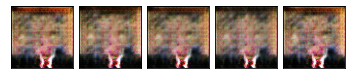

--- EPOCH 34/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.74it/s]
Discriminator loss: 1.0
Generator loss:     0.9999997163177433
Saved checkpoint.


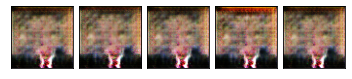

--- EPOCH 35/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.65it/s]
Discriminator loss: 1.0
Generator loss:     0.999999771888991
Saved checkpoint.


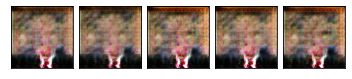

--- EPOCH 36/100 ---
100%|██████████| 133/133 [00:12<00:00, 10.28it/s]
Discriminator loss: 1.0
Generator loss:     0.9999998691386747
Saved checkpoint.


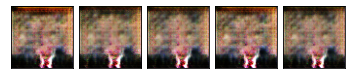

--- EPOCH 37/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.85it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999045429373
Saved checkpoint.


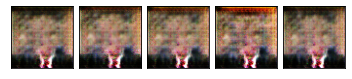

--- EPOCH 38/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.16it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999251580776
Saved checkpoint.


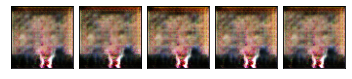

--- EPOCH 39/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.73it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999386027343
Saved checkpoint.


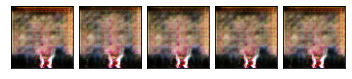

--- EPOCH 40/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.18it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999547363224
Saved checkpoint.


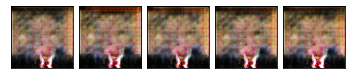

--- EPOCH 41/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.42it/s]
Discriminator loss: 1.0
Generator loss:     0.999999952047391
Saved checkpoint.


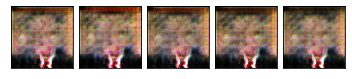

--- EPOCH 42/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.94it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999672846687
Saved checkpoint.


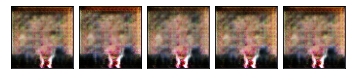

--- EPOCH 43/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.84it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999592178747
Saved checkpoint.


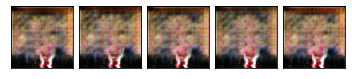

--- EPOCH 44/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.63it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999766959283
Saved checkpoint.


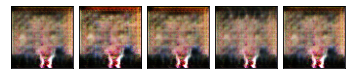

--- EPOCH 45/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.14it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999816256359
Saved checkpoint.


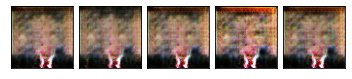

--- EPOCH 46/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.21it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999829701015
Saved checkpoint.


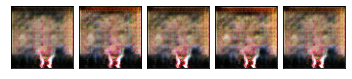

--- EPOCH 47/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.56it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999834182567
Saved checkpoint.


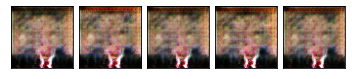

--- EPOCH 48/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.97it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999870034985
Saved checkpoint.


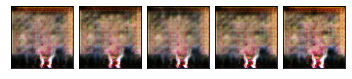

--- EPOCH 49/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.21it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999847627223
Saved checkpoint.


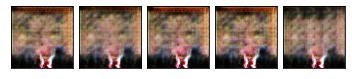

--- EPOCH 50/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.46it/s]
Discriminator loss: 1.0
Generator loss:     0.999999983866412
Saved checkpoint.


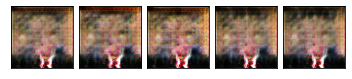

--- EPOCH 51/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.92it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999856590328
Saved checkpoint.


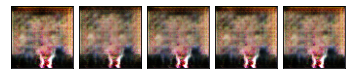

--- EPOCH 52/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.64it/s]
Discriminator loss: 1.0
Generator loss:     0.999999991933206
Saved checkpoint.


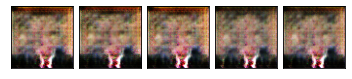

--- EPOCH 53/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.79it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999896924299
Saved checkpoint.


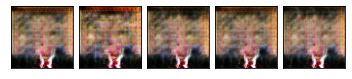

--- EPOCH 54/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.08it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999914850507
Saved checkpoint.


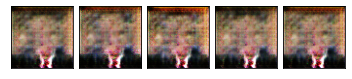

--- EPOCH 55/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.31it/s]
Discriminator loss: 1.0
Generator loss:     0.999999990140585
Saved checkpoint.


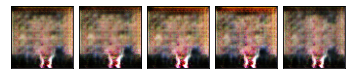

--- EPOCH 56/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.56it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999968629134
Saved checkpoint.


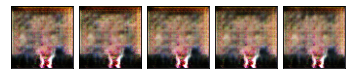

--- EPOCH 57/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.53it/s]
Discriminator loss: 1.0
Generator loss:     0.999999990140585
Saved checkpoint.


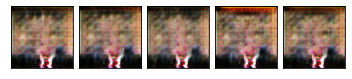

--- EPOCH 58/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.02it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999950702926
Saved checkpoint.


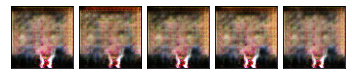

--- EPOCH 59/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.99it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999914850507
Saved checkpoint.


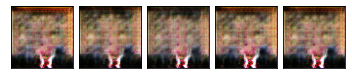

--- EPOCH 60/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.52it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999932776716
Saved checkpoint.


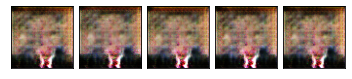

--- EPOCH 61/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.35it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999968629134
Saved checkpoint.


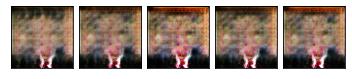

--- EPOCH 62/100 ---
100%|██████████| 133/133 [00:14<00:00,  8.94it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999964147582
Saved checkpoint.


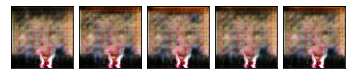

--- EPOCH 63/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.68it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999977592239
Saved checkpoint.


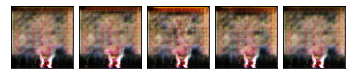

--- EPOCH 64/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.30it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999968629134
Saved checkpoint.


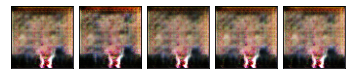

--- EPOCH 65/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.48it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999977592239
Saved checkpoint.


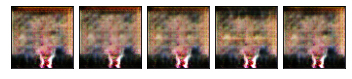

--- EPOCH 66/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.99it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999959666029
Saved checkpoint.


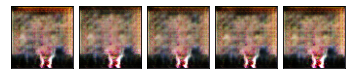

--- EPOCH 67/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.28it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999977592239
Saved checkpoint.


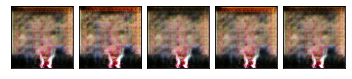

--- EPOCH 68/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.95it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999986555344
Saved checkpoint.


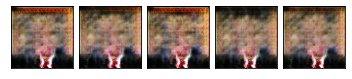

--- EPOCH 69/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.84it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999973110687
Saved checkpoint.


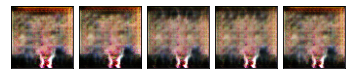

--- EPOCH 70/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.85it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999968629134
Saved checkpoint.


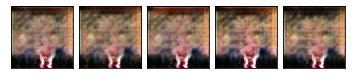

--- EPOCH 71/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.79it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999982073791
Saved checkpoint.


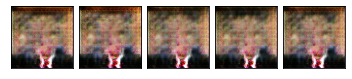

--- EPOCH 72/100 ---
100%|██████████| 133/133 [00:14<00:00,  8.91it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999982073791
Saved checkpoint.


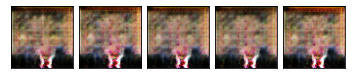

--- EPOCH 73/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.84it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999982073791
Saved checkpoint.


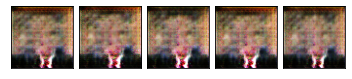

--- EPOCH 74/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.60it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999986555344
Saved checkpoint.


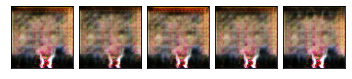

--- EPOCH 75/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.58it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999982073791
Saved checkpoint.


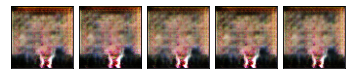

--- EPOCH 76/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.83it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999995518448
Saved checkpoint.


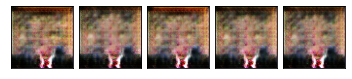

--- EPOCH 77/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.91it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999986555344
Saved checkpoint.


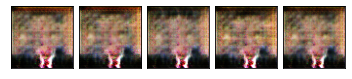

--- EPOCH 78/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.03it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999986555344
Saved checkpoint.


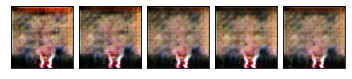

--- EPOCH 79/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.12it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999995518448
Saved checkpoint.


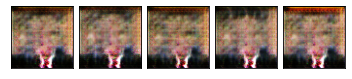

--- EPOCH 80/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.46it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999977592239
Saved checkpoint.


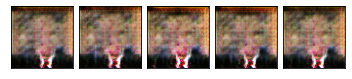

--- EPOCH 81/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.06it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999991036895
Saved checkpoint.


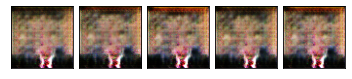

--- EPOCH 82/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.68it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999991036895
Saved checkpoint.


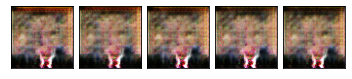

--- EPOCH 83/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.49it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999995518448
Saved checkpoint.


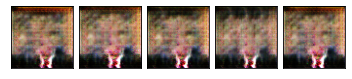

--- EPOCH 84/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.26it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


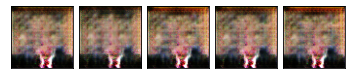

--- EPOCH 85/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.27it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999991036895
Saved checkpoint.


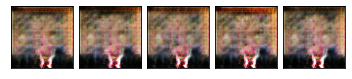

--- EPOCH 86/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.58it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999986555344
Saved checkpoint.


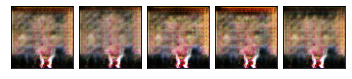

--- EPOCH 87/100 ---
100%|██████████| 133/133 [00:14<00:00,  8.94it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


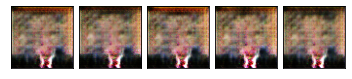

--- EPOCH 88/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.85it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999995518448
Saved checkpoint.


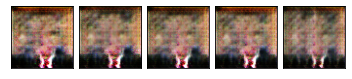

--- EPOCH 89/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.70it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999991036895
Saved checkpoint.


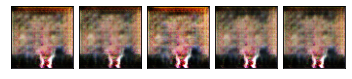

--- EPOCH 90/100 ---
100%|██████████| 133/133 [00:14<00:00,  9.39it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


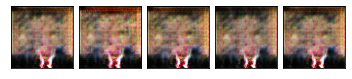

--- EPOCH 91/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.66it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


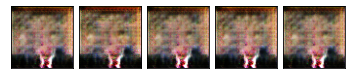

--- EPOCH 92/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.52it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


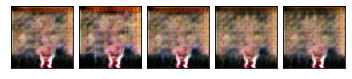

--- EPOCH 93/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.50it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


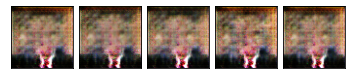

--- EPOCH 94/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.74it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


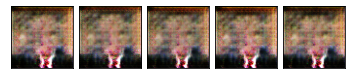

--- EPOCH 95/100 ---
100%|██████████| 133/133 [00:13<00:00, 10.04it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999995518448
Saved checkpoint.


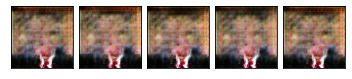

--- EPOCH 96/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.66it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


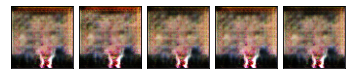

--- EPOCH 97/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.54it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


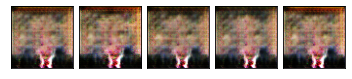

--- EPOCH 98/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.82it/s]
Discriminator loss: 1.0
Generator loss:     0.9999999991036895
Saved checkpoint.


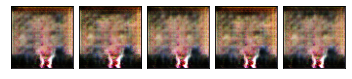

--- EPOCH 99/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.73it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


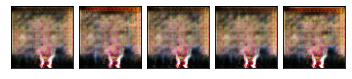

--- EPOCH 100/100 ---
100%|██████████| 133/133 [00:13<00:00,  9.58it/s]
Discriminator loss: 1.0
Generator loss:     1.0
Saved checkpoint.


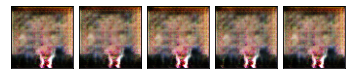

In [8]:
import IPython.display
import tqdm
from gan_ver2 import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


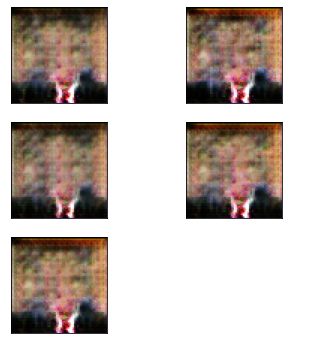

In [9]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
vgan_samples = gen.sample(n=5, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(vgan_samples, nrows=3, figsize=(6,6))

save_image(vgan_samples, 'vgan_samples1.png', nrow=5)


#### Inception Score

In [10]:
vgan_samples = gen.sample(n=64, with_grad=False).cpu()
from inception_score import IgnoreLabelDataset, inception_score
import torch.nn.functional as F
imgs = F.interpolate(vgan_samples, (128, 128))
print (inception_score(IgnoreLabelDataset(imgs.unsqueeze(1)), cuda=True, batch_size=32, resize=False, splits=10))


(2.4335287701572406, 0.4714225761113523)


/home/sakasova/git_homeworks/hw4/solution_omer/project/inception_score.py:44: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(x).data.cpu().numpy()


### SN-GAN 

In [16]:
# Spectral Normalized Discriminator
sn_dsc = gan_ver2.SN_Discriminator(in_size=x0[0].shape).to(device)
print(sn_dsc)

# Model
sn_gen = gan_ver2.Generator(z_dim, featuremap_size=4).to(device)
print(gen)
# Optimizer
sn_dsc_optimizer = create_optimizer(sn_dsc.parameters(), hypers['discriminator_optimizer'])
sn_gen_optimizer = create_optimizer(sn_gen.parameters(), hypers['generator_optimizer'])



# Training
checkpoint_file = 'checkpoints/sn_gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

SN_Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (2): ReLU()
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (5): ReLU()
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): MaxPool2d(kernel_size=8, stride=8, padding=0, dilation=1, ceil_mode=False)
    (8): ReLU()
    (9): Conv2d(256, 512, kernel_size=(1, 1), stride=(1, 1))
    (10): ReLU()
    (11): Conv2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
    (12): Sigmoid()
  )
)
Generator(
  (cnn): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout2d(p=0.5, inplace=False)
    (3): LeakyReLU(ne

**Training Loop**

--- EPOCH 1/100 ---
100%|██████████| 133/133 [00:04<00:00, 29.34it/s]
Discriminator loss: 0.14328014823306995
Generator loss:     0.6205174265835518


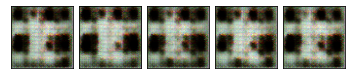

--- EPOCH 2/100 ---
100%|██████████| 133/133 [00:07<00:00, 17.96it/s]
Discriminator loss: 0.35304505606286957
Generator loss:     0.6297302834857675
Saved checkpoint.


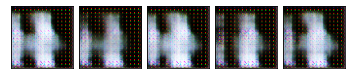

--- EPOCH 3/100 ---
100%|██████████| 133/133 [00:16<00:00,  8.17it/s]
Discriminator loss: 0.9997287724251137
Generator loss:     0.997719591273401
Saved checkpoint.


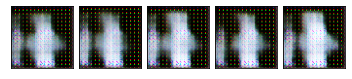

--- EPOCH 4/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.39it/s]
Discriminator loss: 0.9999620932385438
Generator loss:     0.9993466820035662
Saved checkpoint.


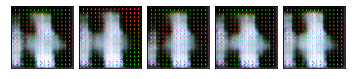

--- EPOCH 5/100 ---
100%|██████████| 133/133 [00:16<00:00,  8.30it/s]
Discriminator loss: 0.9999880853452181
Generator loss:     0.9996867919326725
Saved checkpoint.


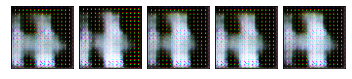

--- EPOCH 6/100 ---
100%|██████████| 133/133 [00:16<00:00,  8.09it/s]
Discriminator loss: 0.9999952782365612
Generator loss:     0.9998174955074052
Saved checkpoint.


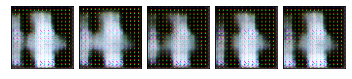

--- EPOCH 7/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.34it/s]
Discriminator loss: 0.999997653907403
Generator loss:     0.999881408716503
Saved checkpoint.


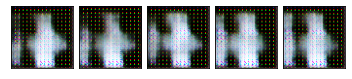

--- EPOCH 8/100 ---
100%|██████████| 133/133 [00:15<00:00,  8.43it/s]
Discriminator loss: 0.9999987837067223
Generator loss:     0.9999170142008846
Saved checkpoint.


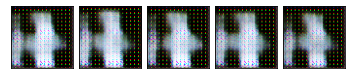

--- EPOCH 9/100 ---
100%|██████████| 133/133 [00:16<00:00,  8.16it/s]
Discriminator loss: 0.9999993461415284
Generator loss:     0.9999418236259231
Saved checkpoint.


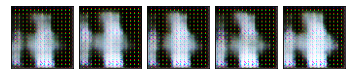

--- EPOCH 10/100 ---
100%|██████████| 133/133 [00:17<00:00,  7.70it/s]
Discriminator loss: 0.9999996011418507
Generator loss:     0.9999565894442394
Saved checkpoint.


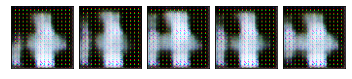

--- EPOCH 11/100 ---
100%|██████████| 133/133 [00:16<00:00,  7.92it/s]
Discriminator loss: 0.9999997481367642
Generator loss:     0.999966347576084
Saved checkpoint.


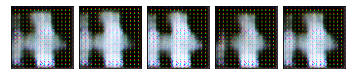

--- EPOCH 12/100 ---
 24%|██▍       | 32/133 [00:03<00:12,  8.10it/s]

 *** Training interrupted by user


In [17]:
import IPython.display
import tqdm
from gan_ver2 import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    sn_gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    sn_dsc, sn_gen,
                    dsc_loss_fn, gen_loss_fn,
                    sn_dsc_optimizer, sn_gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(sn_gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = sn_gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


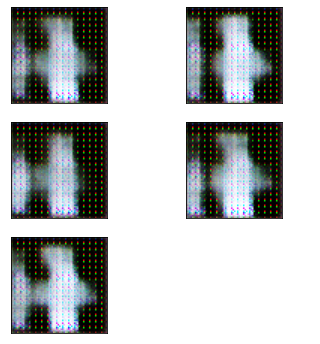

In [18]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
sn_gan_samples = gen.sample(n=5, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(sn_gan_samples, nrows=3, figsize=(6,6))

save_image(sn_gan_samples, 'sn_gan_samples1.png', nrow=5)

#### Inception Score

In [19]:
sn_gan_samples = gen.sample(n=64, with_grad=False).cpu()
from inception_score import IgnoreLabelDataset, inception_score
import torch.nn.functional as F
imgs = F.interpolate(sn_gan_samples, (128, 128))
print (inception_score(IgnoreLabelDataset(imgs.unsqueeze(1)), cuda=True, batch_size=32, resize=False, splits=10))


(1.02552559988747, 0.034984822059650186)


### WGAN 

In [12]:
from torch.autograd import Variable

# Model
wdsc = gan_ver2.Discriminator(im_size).to(device)
wgen = gan_ver2.Generator(z_dim, featuremap_size=4).to(device)

#Loss function
from gan_ver2 import Wdsc_loss_fn
from gan_ver2 import Wgen_loss_fn

# Optimizers
gen_optimizer = torch.optim.RMSprop(wgen.parameters(), lr=lr)
dsc_optimizer = torch.optim.RMSprop(wdsc.parameters(), lr=lr)

# Loss
def Wdsc_loss_fn(y_data, y_generated):
    return gan_ver2.Wdsc_loss_fn(y_data, y_generated)

def Wgen_loss_fn(y_generated):
    return gan_ver2.Wgen_loss_fn(y_generated)

# Training
checkpoint_file = 'checkpoints/wgan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

--- EPOCH 1/100 ---
100%|██████████| 133/133 [00:05<00:00, 25.36it/s]
Discriminator loss: 0.5043800872071345
Generator loss:     0.5031158135349589


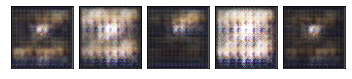

--- EPOCH 2/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.19it/s]
Discriminator loss: 0.5070178916579798
Generator loss:     0.5108820894607028


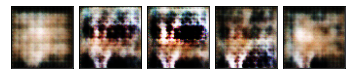

--- EPOCH 3/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.63it/s]
Discriminator loss: 0.5084510432150131
Generator loss:     0.5140478736475894


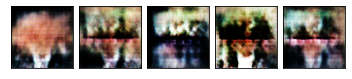

--- EPOCH 4/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.88it/s]
Discriminator loss: 0.5091182069670885
Generator loss:     0.5146343026842389


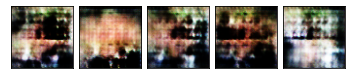

--- EPOCH 5/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.20it/s]
Discriminator loss: 0.5104741360011854
Generator loss:     0.5147471118690377


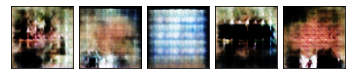

--- EPOCH 6/100 ---
100%|██████████| 133/133 [00:05<00:00, 25.82it/s]
Discriminator loss: 0.5103695468795031
Generator loss:     0.5150606995238397


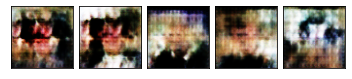

--- EPOCH 7/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.13it/s]
Discriminator loss: 0.5103470857878377
Generator loss:     0.5154569633024976


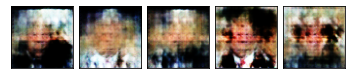

--- EPOCH 8/100 ---
100%|██████████| 133/133 [00:04<00:00, 26.95it/s]
Discriminator loss: 0.5102660615641371
Generator loss:     0.5156884462313545


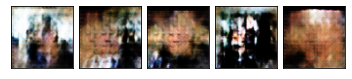

--- EPOCH 9/100 ---
100%|██████████| 133/133 [00:05<00:00, 26.43it/s]
Discriminator loss: 0.5102081110602931
Generator loss:     0.5153394390765885


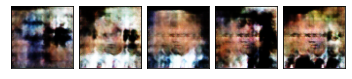

--- EPOCH 10/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.76it/s]
Discriminator loss: 0.5097176369867826
Generator loss:     0.5154728656424615


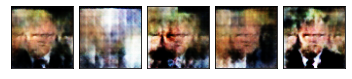

--- EPOCH 11/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.04it/s]
Discriminator loss: 0.5099409563200814
Generator loss:     0.5153984992127669


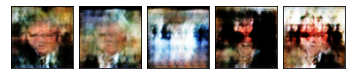

--- EPOCH 12/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.65it/s]
Discriminator loss: 0.5096770238159294
Generator loss:     0.5152844719420698


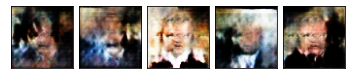

--- EPOCH 13/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.89it/s]
Discriminator loss: 0.5093609134953722
Generator loss:     0.5154339335018531


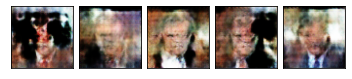

--- EPOCH 14/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.67it/s]
Discriminator loss: 0.5089078240824821
Generator loss:     0.5154873468822107


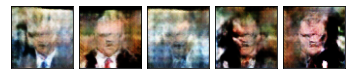

--- EPOCH 15/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.86it/s]
Discriminator loss: 0.5088260841548891
Generator loss:     0.515477036174975


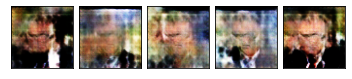

--- EPOCH 16/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.16it/s]
Discriminator loss: 0.5082907994886986
Generator loss:     0.5155020203805507


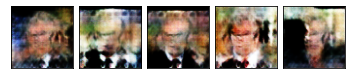

--- EPOCH 17/100 ---
100%|██████████| 133/133 [00:03<00:00, 33.30it/s]
Discriminator loss: 0.5084145754799807
Generator loss:     0.5151965008642441


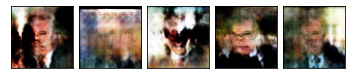

--- EPOCH 18/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.07it/s]
Discriminator loss: 0.5081685073393628
Generator loss:     0.5150934964194334


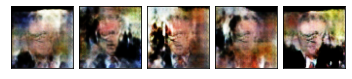

--- EPOCH 19/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.00it/s]
Discriminator loss: 0.5085476609997284
Generator loss:     0.5147979210193893


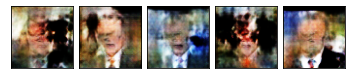

--- EPOCH 20/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.73it/s]
Discriminator loss: 0.5081465186033034
Generator loss:     0.5151732572935578


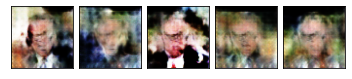

--- EPOCH 21/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.81it/s]
Discriminator loss: 0.5082351502619291
Generator loss:     0.5148687223742779


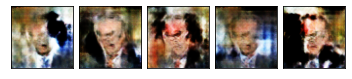

--- EPOCH 22/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.89it/s]
Discriminator loss: 0.50792152854733
Generator loss:     0.5147584358552345


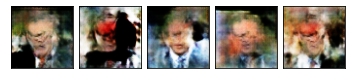

--- EPOCH 23/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.91it/s]
Discriminator loss: 0.5078440389238802
Generator loss:     0.5145928738708783


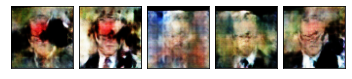

--- EPOCH 24/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.86it/s]
Discriminator loss: 0.5074574503683507
Generator loss:     0.514766296049706


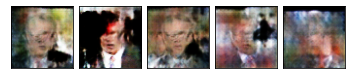

--- EPOCH 25/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.74it/s]
Discriminator loss: 0.507958677254225
Generator loss:     0.5145761778480128


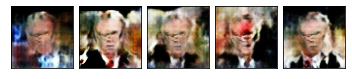

--- EPOCH 26/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.64it/s]
Discriminator loss: 0.5075671309815314
Generator loss:     0.5145313690479537


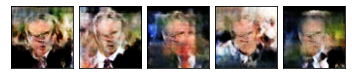

--- EPOCH 27/100 ---
100%|██████████| 133/133 [00:05<00:00, 24.55it/s]
Discriminator loss: 0.5074031043769722
Generator loss:     0.5144049579039552


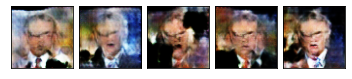

--- EPOCH 28/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.23it/s]
Discriminator loss: 0.5074624481954073
Generator loss:     0.5142716577178553


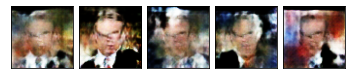

--- EPOCH 29/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.22it/s]
Discriminator loss: 0.5073829882575157
Generator loss:     0.5143020847686252


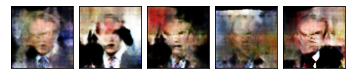

--- EPOCH 30/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.91it/s]
Discriminator loss: 0.5074480341789418
Generator loss:     0.5141960351090682


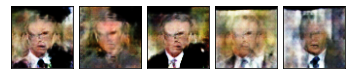

--- EPOCH 31/100 ---
100%|██████████| 133/133 [00:03<00:00, 33.63it/s]
Discriminator loss: 0.507104107759949
Generator loss:     0.5142468012365183


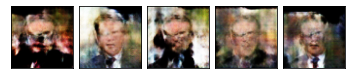

--- EPOCH 32/100 ---
100%|██████████| 133/133 [00:03<00:00, 33.56it/s]
Discriminator loss: 0.5069096142188051
Generator loss:     0.5144583941402292


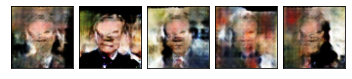

--- EPOCH 33/100 ---
100%|██████████| 133/133 [00:03<00:00, 33.53it/s]
Discriminator loss: 0.5069589628312821
Generator loss:     0.5142536683190138


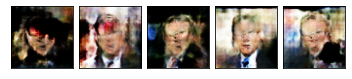

--- EPOCH 34/100 ---
100%|██████████| 133/133 [00:03<00:00, 33.39it/s]
Discriminator loss: 0.507053792476654
Generator loss:     0.5140716411117324


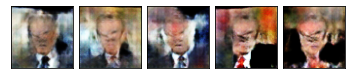

--- EPOCH 35/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.28it/s]
Discriminator loss: 0.5065958376665761
Generator loss:     0.5140955475039948


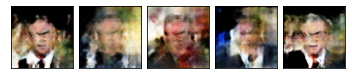

--- EPOCH 36/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.40it/s]
Discriminator loss: 0.5071767263842705
Generator loss:     0.5139501448860742


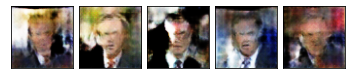

--- EPOCH 37/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.07it/s]
Discriminator loss: 0.507073043880606
Generator loss:     0.5139041202408927


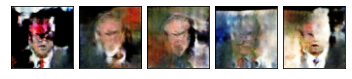

--- EPOCH 38/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.54it/s]
Discriminator loss: 0.5067880695923827
Generator loss:     0.5141272101187169


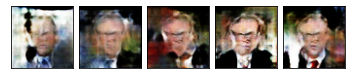

--- EPOCH 39/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.65it/s]
Discriminator loss: 0.5069632962682193
Generator loss:     0.5138895139658362


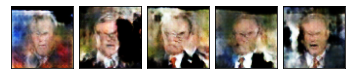

--- EPOCH 40/100 ---
100%|██████████| 133/133 [00:04<00:00, 33.09it/s]
Discriminator loss: 0.5071066340109459
Generator loss:     0.5137064887168712


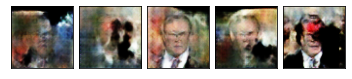

--- EPOCH 41/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.34it/s]
Discriminator loss: 0.5067858866282872
Generator loss:     0.5137954430472582


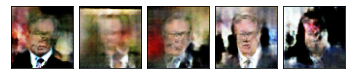

--- EPOCH 42/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.33it/s]
Discriminator loss: 0.5069456104945419
Generator loss:     0.5138248084183026


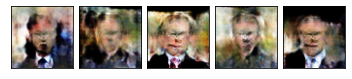

--- EPOCH 43/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.72it/s]
Discriminator loss: 0.5066504680124441
Generator loss:     0.5138543517069709


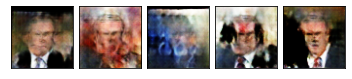

--- EPOCH 44/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.34it/s]
Discriminator loss: 0.5067608486440845
Generator loss:     0.5138725288828513


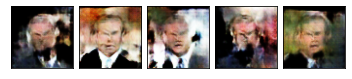

--- EPOCH 45/100 ---
100%|██████████| 133/133 [00:03<00:00, 33.31it/s]
Discriminator loss: 0.5065002647557653
Generator loss:     0.5137153765312711


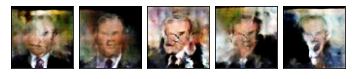

--- EPOCH 46/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.75it/s]
Discriminator loss: 0.5065692490652988
Generator loss:     0.5137628106246317


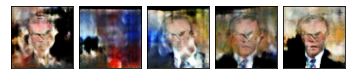

--- EPOCH 47/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.70it/s]
Discriminator loss: 0.5065922165723672
Generator loss:     0.5137926098099328


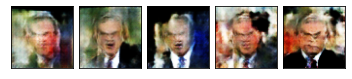

--- EPOCH 48/100 ---
100%|██████████| 133/133 [00:04<00:00, 27.94it/s]
Discriminator loss: 0.5066135693761639
Generator loss:     0.5136800861000118


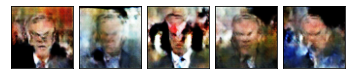

--- EPOCH 49/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.23it/s]
Discriminator loss: 0.506422337732817
Generator loss:     0.5135748189194758


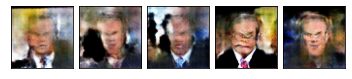

--- EPOCH 50/100 ---
100%|██████████| 133/133 [00:04<00:00, 28.39it/s]
Discriminator loss: 0.5066680126172259
Generator loss:     0.513582886609816


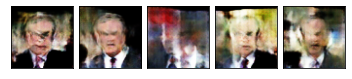

--- EPOCH 51/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.43it/s]
Discriminator loss: 0.5065512356901527
Generator loss:     0.5133484561640517


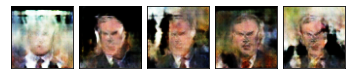

--- EPOCH 52/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.89it/s]
Discriminator loss: 0.5065845044931971
Generator loss:     0.5132389557092709


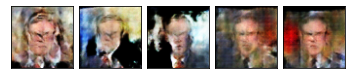

--- EPOCH 53/100 ---
100%|██████████| 133/133 [00:03<00:00, 33.40it/s]
Discriminator loss: 0.5073965409196409
Generator loss:     0.5130100519137275
Saved checkpoint.


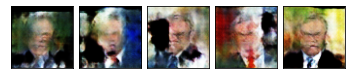

--- EPOCH 54/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.65it/s]
Discriminator loss: 0.5063634196618446
Generator loss:     0.5131821538272657


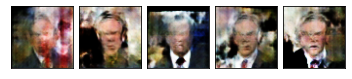

--- EPOCH 55/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.77it/s]
Discriminator loss: 0.5064023280502262
Generator loss:     0.513351727697186


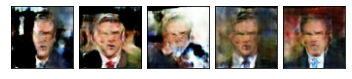

--- EPOCH 56/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.72it/s]
Discriminator loss: 0.5061528530335964
Generator loss:     0.513400818172254


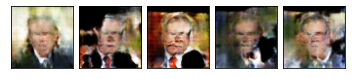

--- EPOCH 57/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.77it/s]
Discriminator loss: 0.5063927458193069
Generator loss:     0.5131965996627521


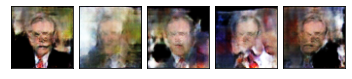

--- EPOCH 58/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.61it/s]
Discriminator loss: 0.5063444434252
Generator loss:     0.5132595753311214


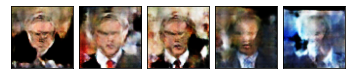

--- EPOCH 59/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.38it/s]
Discriminator loss: 0.5063005508784961
Generator loss:     0.5129780455639488


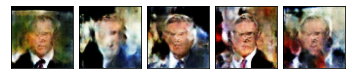

--- EPOCH 60/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.58it/s]
Discriminator loss: 0.5060635242695198
Generator loss:     0.5131319644755887


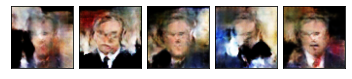

--- EPOCH 61/100 ---
100%|██████████| 133/133 [00:05<00:00, 24.47it/s]
Discriminator loss: 0.5064609949301956
Generator loss:     0.5130916829396012


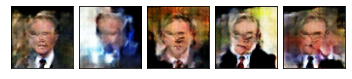

--- EPOCH 62/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.02it/s]
Discriminator loss: 0.5062811069918755
Generator loss:     0.5130436505590167


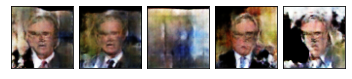

--- EPOCH 63/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.88it/s]
Discriminator loss: 0.5062390357480013
Generator loss:     0.5130333196847958


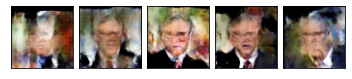

--- EPOCH 64/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.09it/s]
Discriminator loss: 0.5064538354264166
Generator loss:     0.5128093164666254
Saved checkpoint.


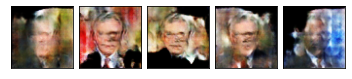

--- EPOCH 65/100 ---
100%|██████████| 133/133 [00:06<00:00, 21.65it/s]
Discriminator loss: 0.5064313053188467
Generator loss:     0.5127056075218028
Saved checkpoint.


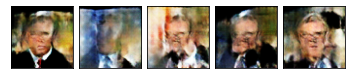

--- EPOCH 66/100 ---
100%|██████████| 133/133 [00:05<00:00, 25.33it/s]
Discriminator loss: 0.5064098882047754
Generator loss:     0.5128062004433539
Saved checkpoint.


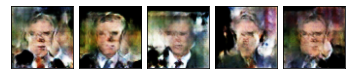

--- EPOCH 67/100 ---
100%|██████████| 133/133 [00:04<00:00, 29.96it/s]
Discriminator loss: 0.5060088040685295
Generator loss:     0.5127472160454083


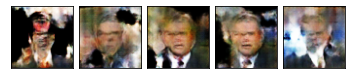

--- EPOCH 68/100 ---
100%|██████████| 133/133 [00:05<00:00, 24.01it/s]
Discriminator loss: 0.5064212953237662
Generator loss:     0.5126361371879291
Saved checkpoint.


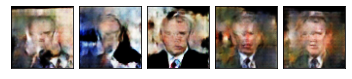

--- EPOCH 69/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.59it/s]
Discriminator loss: 0.5062564324615593
Generator loss:     0.5126247674898994
Saved checkpoint.


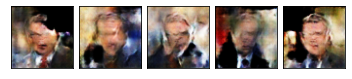

--- EPOCH 70/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.24it/s]
Discriminator loss: 0.5058729009968894
Generator loss:     0.5127912455035332


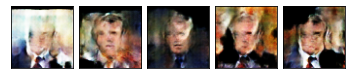

--- EPOCH 71/100 ---
100%|██████████| 133/133 [00:04<00:00, 26.88it/s]
Discriminator loss: 0.5061400848671906
Generator loss:     0.5124935767704383
Saved checkpoint.


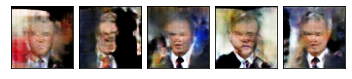

--- EPOCH 72/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.12it/s]
Discriminator loss: 0.506343988995803
Generator loss:     0.5127467495158202
Saved checkpoint.


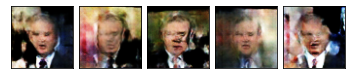

--- EPOCH 73/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.37it/s]
Discriminator loss: 0.5058411709348062
Generator loss:     0.5125900323229625


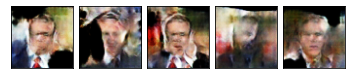

--- EPOCH 74/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.32it/s]
Discriminator loss: 0.5061699443293693
Generator loss:     0.5127352296857906


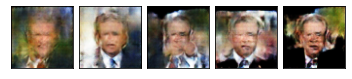

--- EPOCH 75/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.53it/s]
Discriminator loss: 0.5055758379455796
Generator loss:     0.5128268648807267


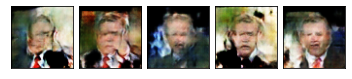

--- EPOCH 76/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.99it/s]
Discriminator loss: 0.5059933568301954
Generator loss:     0.5125304832494348


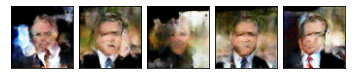

--- EPOCH 77/100 ---
100%|██████████| 133/133 [00:04<00:00, 27.61it/s]
Discriminator loss: 0.5059954257387864
Generator loss:     0.5126536448199049


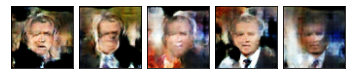

--- EPOCH 78/100 ---
100%|██████████| 133/133 [00:04<00:00, 26.76it/s]
Discriminator loss: 0.5060785722015495
Generator loss:     0.5124368362856987
Saved checkpoint.


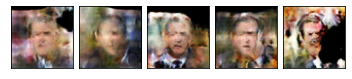

--- EPOCH 79/100 ---
100%|██████████| 133/133 [00:05<00:00, 25.76it/s]
Discriminator loss: 0.5060208316584279
Generator loss:     0.5124236703815317
Saved checkpoint.


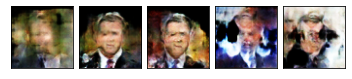

--- EPOCH 80/100 ---
100%|██████████| 133/133 [00:04<00:00, 27.53it/s]
Discriminator loss: 0.5060298223244516
Generator loss:     0.5123048487462496
Saved checkpoint.


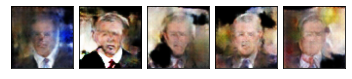

--- EPOCH 81/100 ---
100%|██████████| 133/133 [00:05<00:00, 25.23it/s]
Discriminator loss: 0.5060468396746126
Generator loss:     0.512263816550262
Saved checkpoint.


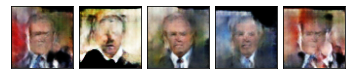

--- EPOCH 82/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.42it/s]
Discriminator loss: 0.5060904306128509
Generator loss:     0.5124652318488386
Saved checkpoint.


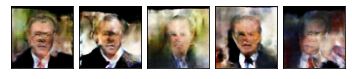

--- EPOCH 83/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.62it/s]
Discriminator loss: 0.5055012624514731
Generator loss:     0.5126477946016125


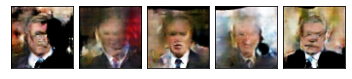

--- EPOCH 84/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.11it/s]
Discriminator loss: 0.5060462676044694
Generator loss:     0.512191579306036
Saved checkpoint.


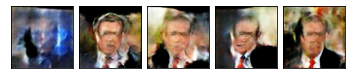

--- EPOCH 85/100 ---
100%|██████████| 133/133 [00:05<00:00, 25.88it/s]
Discriminator loss: 0.505576498302302
Generator loss:     0.5124375076222241


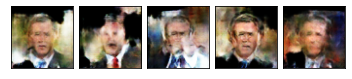

--- EPOCH 86/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.46it/s]
Discriminator loss: 0.5059493504520646
Generator loss:     0.5121078365727475
Saved checkpoint.


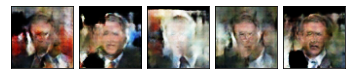

--- EPOCH 87/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.18it/s]
Discriminator loss: 0.5058022540314753
Generator loss:     0.5122335373907161
Saved checkpoint.


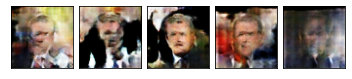

--- EPOCH 88/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.80it/s]
Discriminator loss: 0.5058015448258335
Generator loss:     0.512438336261233


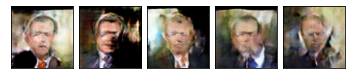

--- EPOCH 89/100 ---
100%|██████████| 133/133 [00:05<00:00, 23.40it/s]
Discriminator loss: 0.506289598861135
Generator loss:     0.5119576162861702
Saved checkpoint.


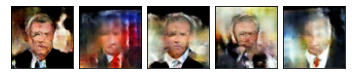

--- EPOCH 90/100 ---
100%|██████████| 133/133 [00:04<00:00, 26.64it/s]
Discriminator loss: 0.5055581033229828
Generator loss:     0.5121764047701556


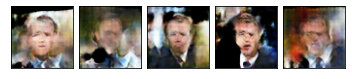

--- EPOCH 91/100 ---
100%|██████████| 133/133 [00:04<00:00, 30.84it/s]
Discriminator loss: 0.5056904890483483
Generator loss:     0.5122761273742619


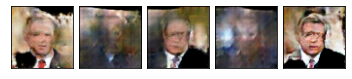

--- EPOCH 92/100 ---
100%|██████████| 133/133 [00:05<00:00, 24.13it/s]
Discriminator loss: 0.5057071920176198
Generator loss:     0.5122920005841363


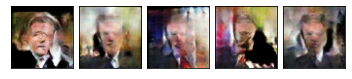

--- EPOCH 93/100 ---
100%|██████████| 133/133 [00:04<00:00, 31.08it/s]
Discriminator loss: 0.5060988743054239
Generator loss:     0.5121998701776777
Saved checkpoint.


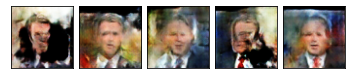

--- EPOCH 94/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.26it/s]
Discriminator loss: 0.505620085879376
Generator loss:     0.5120969316116849


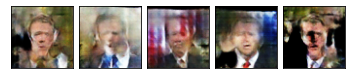

--- EPOCH 95/100 ---
100%|██████████| 133/133 [00:04<00:00, 27.79it/s]
Discriminator loss: 0.5056444489418116
Generator loss:     0.5118359448318195
Saved checkpoint.


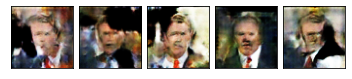

--- EPOCH 96/100 ---
100%|██████████| 133/133 [00:04<00:00, 27.07it/s]
Discriminator loss: 0.5056419285168325
Generator loss:     0.5120819166190642
Saved checkpoint.


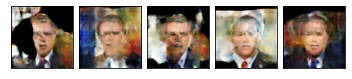

--- EPOCH 97/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.09it/s]
Discriminator loss: 0.5061872146631542
Generator loss:     0.5116508782358098
Saved checkpoint.


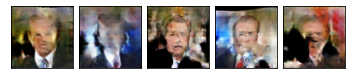

--- EPOCH 98/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.15it/s]
Discriminator loss: 0.5056539605882832
Generator loss:     0.5120044727074472
Saved checkpoint.


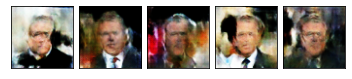

--- EPOCH 99/100 ---
100%|██████████| 133/133 [00:05<00:00, 26.11it/s]
Discriminator loss: 0.5057774770976906
Generator loss:     0.5118941019352218
Saved checkpoint.


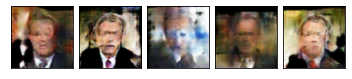

--- EPOCH 100/100 ---
100%|██████████| 133/133 [00:04<00:00, 32.98it/s]
Discriminator loss: 0.5059054545441964
Generator loss:     0.5118285309999508
Saved checkpoint.


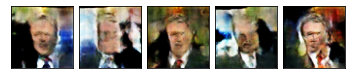

In [13]:
import IPython.display
import tqdm
from gan_ver2 import Wasserstein_train_batch, save_checkpoint

num_epochs = 100

n_critic=2

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final
    
try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                # Wasserstein training batch
                dsc_loss, gen_loss = Wasserstein_train_batch(
                    wdsc, wgen,
                    Wdsc_loss_fn, Wgen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data,n_critic)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(wgen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = wgen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')


*** Images Generated from best model:


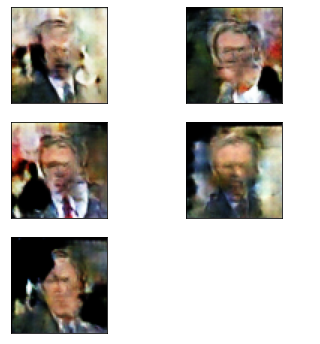

In [14]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
wgan_samples = gen.sample(n=5, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(wgan_samples, nrows=3, figsize=(6,6))

save_image(wgan_samples, 'wgan_samples.png', nrow=5)

#### Inception Score

In [15]:
wgan_samples = gen.sample(n=64, with_grad=False).cpu()
from inception_score import IgnoreLabelDataset, inception_score
import torch.nn.functional as F
imgs = F.interpolate(wgan_samples, (128, 128))
print (inception_score(IgnoreLabelDataset(imgs.unsqueeze(1)), cuda=True, batch_size=32, resize=False, splits=10))


(5.123290648160411, 0.6401361758453795)


/home/sakasova/git_homeworks/hw4/solution_omer/project/inception_score.py:44: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(x).data.cpu().numpy()
